# TU257 - Assignment 1

#### Student 1: Darragh McLaughlin
#### Student 2: Eamonn Kelly

#### Group Num= 9
#### Problem Set= 1

In [275]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import sweetviz as sv
import copy
from sklearn import model_selection
from sklearn.metrics import accuracy_score, log_loss, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn import neural_network as nn
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import roc_curve, auc
from numpy import mean, std
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn import datasets
from sklearn import svm
from sklearn import preprocessing 
from imblearn.over_sampling import SMOTE



%matplotlib inline

## Step 1 - Importing the Data Set

Data has been sourced from [UCI Machine Learning Repository - Bank Marketing](https://archive.ics.uci.edu/dataset/222/bank+marketing)

Data Sets provided under consideration:
1. 'bank.csv'
    - contains 10% of the data (4521 rows) randomly selected from 'bank-full.csv'  dataset. We will not use this.
1. 'bank-full.csv'
    - contains 4521 rows. Also contains a 'Balance' column of data. This is not present in other 'additional' datasets mentioned below, as such will determine if it is possible and worthwhile including in our dataset. 
    - This data set also uses dates i.e. 5th May, etc in a 'day' column, which could be useful to predict a time of month success rate, i.e. early or late in the month, when people get paid could feed into that, whereas the additional data set uses a 'days_of_week' column. i.e. Mon, Tues, etc
1. 'bank-additional.csv' 
    - contains approx 10% of the data (4120 rows) randomly selected from 'bank-additional-full.csv' rows. Will not use this.
1. 'bank-additional-full.csv' > (41189 rows)
    - Contains (41189 rows) of data, based on "Bank Marketing" UCI dataset, includes 5 new social and economic attributes. This contains the most data and will our starting point data set.

In [276]:
# using path because we are both using different machines so easy for switching between files
path = 'G:\GG\da-cmpu4077-assignment-a\eamonn'
file_path = os.path.join(path,'bank-additional-full.csv')
bankdf = pd.read_csv(file_path, sep = ';', skipinitialspace=True)
bankdf.head()

<>:2: SyntaxWarning: invalid escape sequence '\G'
<>:2: SyntaxWarning: invalid escape sequence '\G'
C:\Users\eamon\AppData\Local\Temp\ipykernel_22696\2383091321.py:2: SyntaxWarning: invalid escape sequence '\G'
  path = 'G:\GG\da-cmpu4077-assignment-a\eamonn'


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


## Note there is an addiotnal file labelled 'bank-full.csv'
- We imported it and included it origianlly and tested the extra varaibles contained in the data. 
- The 'balance' and 'day' columns, in that dataset both contain 82% NaN cells in their columns after investigation. 
- As such we will not include in dataset as missing too much data is missing and is too great a number to substitute with predicted values.
- After merging and cleaning, we 39,634 cells are empty out of 48,127, which is 82%. Missing too many rows for data to have an impact on outcome.
- We revert to original 'bank-additional-full' dataset from here on. 

## Step 2 - Data Exploration

In [277]:
# starting off with a profile report
profile = ProfileReport(bankdf)

In [278]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [279]:

file_path = os.path.join(path,'Report-new-22222.html')
profile.to_file(file_path)

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### The above gives a quick overview of the data.

In [280]:
### Step 2.1 - Manual Data Exploration

In [281]:
bankdf.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [282]:
# view various dataframe details
print ("Rows     : " ,bankdf.shape[0])
print ("Columns  : " ,bankdf.shape[1])
print('------')
print ("\nFeatures : \n" ,bankdf.columns.tolist())
print('------')
print ("\nMissing values :  ", bankdf.isnull().sum().values.sum())
print('------')
print ("\nUnique values :  \n",bankdf.nunique())
print('------')
print('\n null values = ', bankdf.isnull().values.any())
print('------')
df_missing = (bankdf=='?').sum()
print('\"?\" values present =  \n',df_missing)

Rows     :  41188
Columns  :  21
------

Features : 
 ['age', 'job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays', 'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'y']
------

Missing values :   0
------

Unique values :  
 age                 78
job                 12
marital              4
education            8
default              3
housing              3
loan                 3
contact              2
month               10
day_of_week          5
duration          1544
campaign            42
pdays               27
previous             8
poutcome             3
emp.var.rate        10
cons.price.idx      26
cons.conf.idx       26
euribor3m          316
nr.employed         11
y                    2
dtype: int64
------

 null values =  False
------
"?" values present =  
 age               0
job               0
marital           0
education         0
default 

In [283]:
bankdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [284]:
# Checking for duplicates
## 12 found 
bankdf.duplicated().sum()

12

In [285]:
## Getting summary statistics for numerical data
bankdf.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,41188.0,40.024060,10.421250,17.000,32.000,38.000,47.000,98.000
duration,41188.0,258.285010,259.279249,0.000,102.000,180.000,319.000,4918.000
campaign,41188.0,2.567593,2.770014,1.000,1.000,2.000,3.000,56.000
pdays,41188.0,962.475454,186.910907,0.000,999.000,999.000,999.000,999.000
previous,41188.0,0.172963,0.494901,0.000,0.000,0.000,0.000,7.000
emp.var.rate,41188.0,0.081886,1.570960,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,41188.0,93.575664,0.578840,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,41188.0,-40.502600,4.628198,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41188.0,3.621291,1.734447,0.634,1.344,4.857,4.961,5.045
nr.employed,41188.0,5167.035911,72.251528,4963.600,5099.100,5191.000,5228.100,5228.100


### Splitting data into categorical and numerical and then getting differnt plots based on that. 

#### Numerical 

In [286]:
bankdf.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

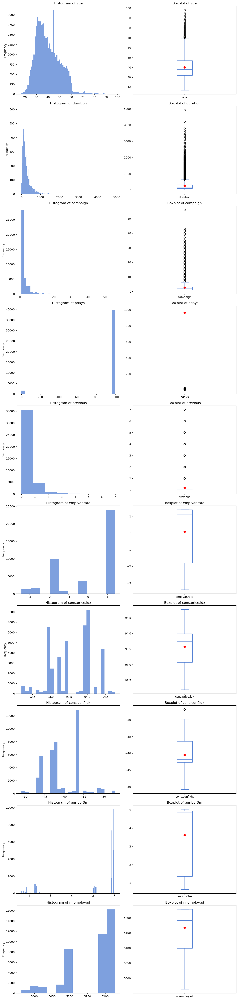

In [287]:
# Select numeric columns
## include=['number'] tells pandas to filter columns that have a numeric data type, i.e int64 or float64 as per above.
numeric_columns = bankdf.select_dtypes(include=['number']).columns

# create subplots: (# of rows,(number(len) of numeric columns) *2 columns one for histogram and one for boxplot. 
## Figsize here is doing 12 inches width and height is 5, but making it longer for the amount of numerical data hence len(numeric_columns)
fig, axes = plt.subplots(len(numeric_columns), 2, figsize=(12, 5 * len(numeric_columns)))

## enumerate() adds an index (starting from 0 by default) to an iterable.
### Each iteration assigns:
#### i The index (0, 1, 2, 3 etc.)
#### col: The column name 

for i, col in enumerate(numeric_columns):
    # Calculate mean for each varaible for use in the scatterplot below 
    
    mean_value = bankdf[col].mean()

    ### Note here for the hsitograms we are using the number of bins assocaited with nunque of the varaibles. 
    num_bins = bankdf[col].nunique()
    
    # Histogram: 50 bins, 70% transparcency, blue, put it in row(i) starting from 0 and col 0 so first column.
    bankdf[col].plot(kind='hist', bins=num_bins, alpha=0.7, color='b', ax=axes[i, 0])
    axes[i, 0].set_title(f'Histogram of {col}')

    # Boxplot (transposing it on its side and adding the mean per variable ina  scatter plot)
    bankdf[col].plot(kind='box', color='b', ax=axes[i, 1])
    axes[i, 1].set_title(f'Boxplot of {col}')
    # Trying to get the boxplot to stay within th eimage, struggling with this part. 
    #axes[i, 1].set_xlim(bankdf[col].min() - 5, bankdf[col].max() + 5)
    # Adding scatterplit just ot have mean as a dot
    ## Z order is to overlay the mean on the graph kind of like ggplot2
    axes[i, 1].scatter(1,mean_value, color='red', s=50, zorder = 2) 

# Adjust layout
plt.tight_layout()
plt.show()

In [288]:
## lookat some specific varuables with reduced bins as they seem to follow a similar trend. 
## Trending columns 
### For some reason loop glitches so showing three individual plots here. 

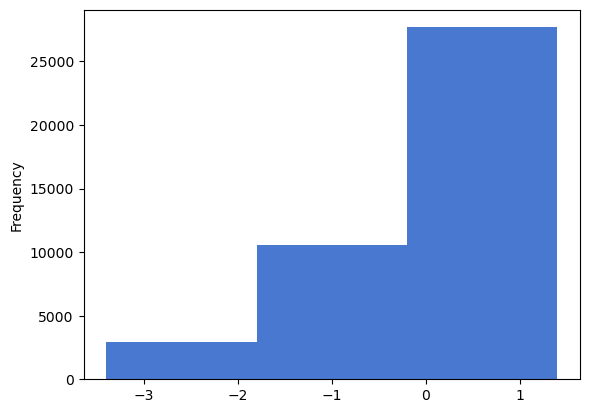

In [289]:
bankdf['emp.var.rate'].plot(kind='hist', bins = 3, color='b')
plt.show()

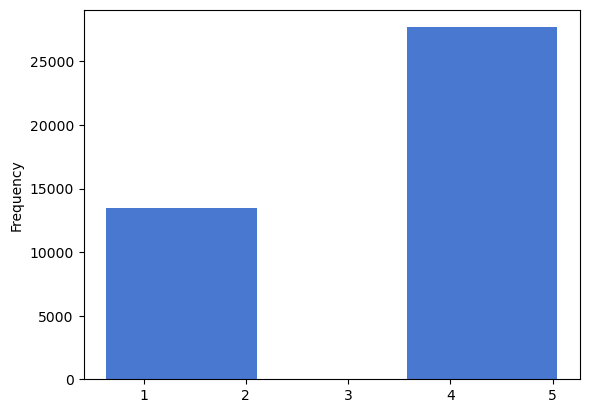

In [290]:
## Seems like there are two regimes of monetary policy stances. 
bankdf['euribor3m'].plot(kind='hist', bins = 3, color='b')
plt.show()

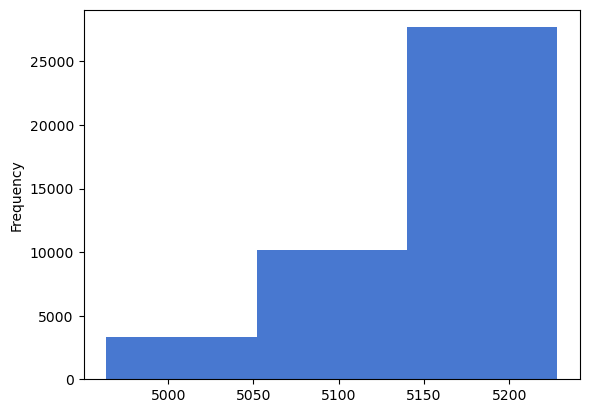

In [291]:
# Nost likely follows the monetary policy stance, even if step change with three bins. 
bankdf['nr.employed'].plot(kind='hist', bins = 3, color='b')
plt.show()

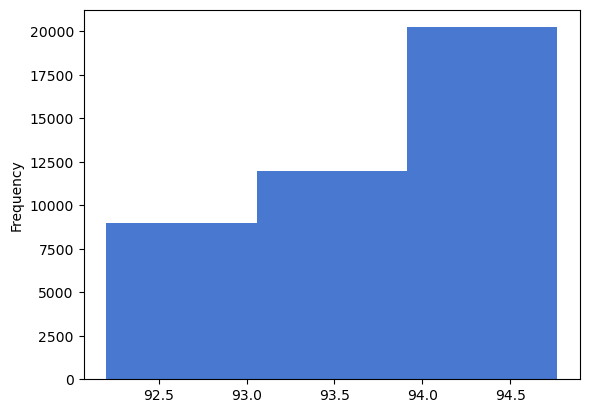

In [292]:
# Nost likely follows the monetary policy stance, even if step change with three bins. 
bankdf['cons.price.idx'].plot(kind='hist', bins = 3, color='b')
plt.show()

#### Categorical

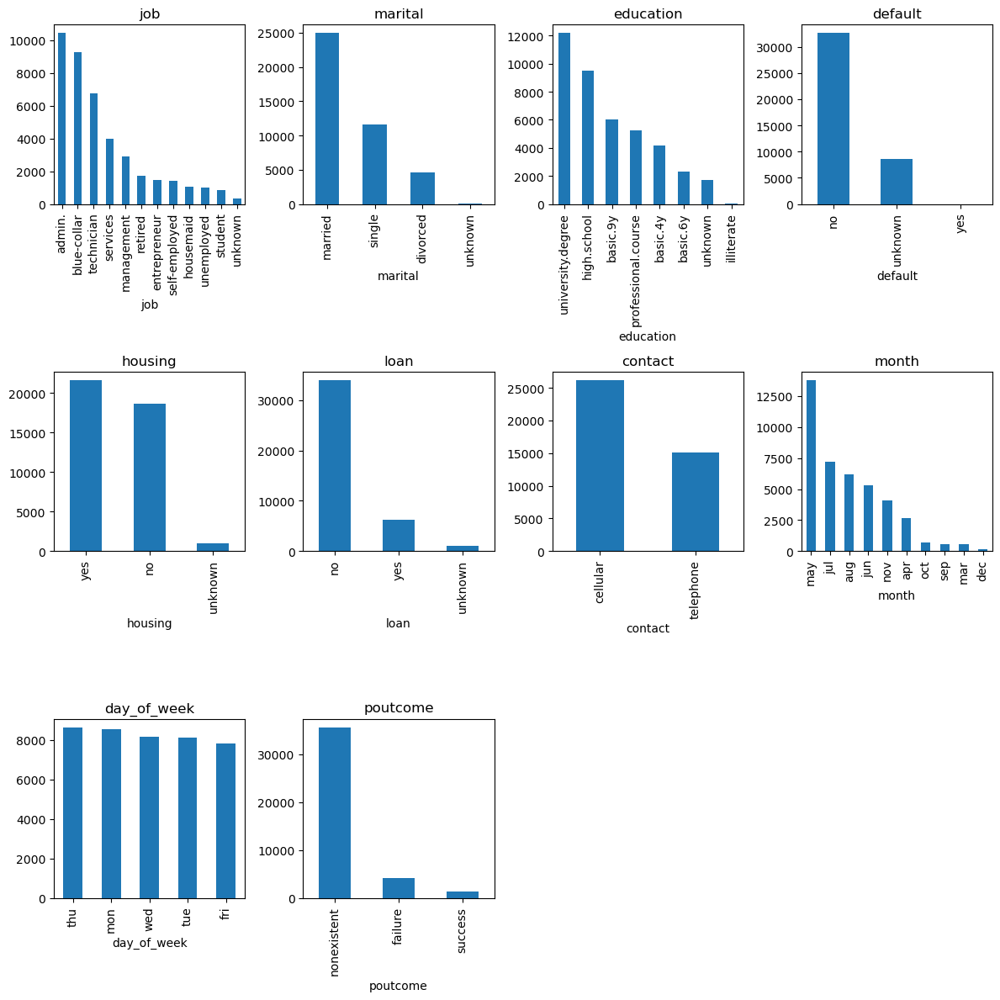

In [293]:
# Categorical Plots
# List of categorical columns
categorical_columns = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome']

n_cols = 4  # define the number of columns

# now we check if the number of columns of that type is divisible by the number
# of columns we defined
if len(categorical_columns) % n_cols == 0:  # if it is divisible (no remainder)
    n_rows = int(len(categorical_columns) / n_cols)
else:  # if it is not divisible (remainder)
    n_rows = int(len(categorical_columns) / n_cols) + 1

# define the figure and its subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 12))  # increased figsize for better view

cur_col = 0  # here we'll store the current column of the plot we are at
cur_row = 0  # here we'll store the current row of the plot we are at

# Iterate over the column's names
for column_name in categorical_columns:
    # Plot the value counts for each categorical column
    bankdf[column_name].value_counts().plot(kind='bar', ax=axes[cur_row, cur_col], title=column_name)
    
    # Move to the next column
    cur_col += 1
    
    # After, we must check we are still within the boundaries
    if cur_col == n_cols:  # if we are beyond the boundary:
        cur_row += 1  # move to the next row (i.e., increment the row count)
        cur_col = 0  # reset the count of columns (i.e., position at the first column)

# Remove unused axes (we are working with categorical columns here, so check for the number of categorical axes)
for ax in axes.flat[len(categorical_columns):]:
    ax.remove()

# Clean layout for a better look
plt.tight_layout()

# Display the plots
plt.show()

### Renaming target variable 

In [294]:
bankdf.rename(columns={'y':'Target'},inplace = True)

#### Changing our categorical varaible into numerical data
 1. we will make a copy here of our data and work on it from now on

In [295]:
df = copy.deepcopy(bankdf)

In [296]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,Target
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [297]:
# encode categorical variables using label Encoder

df_categorical = df.select_dtypes(include=['object'])
df_categorical.head()

# applying label encoder to df_categorical
le = preprocessing.LabelEncoder()
df_categorical = df_categorical.apply(le.fit_transform)
df_categorical.head()

# Next, Concatenate df_categorical dataframe with original df (dataframe)

# first, Drop earlier duplicate columns which had categorical values
df = df.drop(df_categorical.columns, axis = 1)
df = pd.concat([df,df_categorical], axis =1)
df.head()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,Target
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,1,0,0,0,0,1,6,1,1,0
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,1,3,1,0,0,1,6,1,1,0
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,1,3,0,2,0,1,6,1,1,0
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,1,1,0,0,0,1,6,1,1,0
4,56,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,1,3,0,0,2,1,6,1,1,0


In [298]:
# making correlation matrix
corr_matrix=df.corr()
corr_matrix

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,Target
age,1.000000,-0.000866,0.004594,-0.034369,0.024365,-0.000371,0.000857,0.129372,0.010767,-0.017725,...,-0.389753,-0.117892,0.164965,-0.001603,-0.007368,0.007021,-0.024877,-0.017572,0.019750,0.030399
duration,-0.000866,1.000000,-0.071699,-0.047577,0.020640,-0.027968,0.005312,-0.008173,-0.032897,-0.044703,...,0.010290,-0.015102,-0.011794,-0.007658,-0.000916,-0.026657,0.003690,0.021950,0.033360,0.405274
campaign,0.004594,-0.071699,1.000000,0.052584,-0.079141,0.150754,0.127836,-0.013733,0.135133,0.144095,...,-0.007240,0.000371,0.032825,-0.011010,0.005166,0.077368,-0.062059,-0.038288,0.032586,-0.066357
pdays,-0.034369,-0.047577,0.052584,1.000000,-0.587514,0.271004,0.078889,-0.091342,0.296899,0.372605,...,-0.037942,-0.046626,0.080062,-0.010551,0.000345,0.117970,-0.047891,-0.009531,-0.475619,-0.324914
previous,0.024365,0.020640,-0.079141,-0.587514,1.000000,-0.420489,-0.203130,-0.050936,-0.454494,-0.501333,...,0.038689,0.038831,-0.102416,0.021314,-0.001327,-0.212848,0.103157,-0.004102,-0.313110,0.230181
emp.var.rate,-0.000371,-0.027968,0.150754,0.271004,-0.420489,1.000000,0.775334,0.196041,0.972245,0.906970,...,-0.084210,-0.043778,0.203263,-0.060196,0.001849,0.393584,-0.178782,0.033245,0.192972,-0.298334
cons.price.idx,0.000857,0.005312,0.127836,0.078889,-0.203130,0.775334,1.000000,0.058986,0.688230,0.522034,...,-0.057477,-0.081607,0.168073,-0.080504,-0.002430,0.591474,-0.004239,0.005644,0.211330,-0.136211
cons.conf.idx,0.129372,-0.008173,-0.013733,-0.091342,-0.050936,0.196041,0.058986,1.000000,0.277686,0.100513,...,-0.033783,0.078799,0.026522,-0.033845,-0.012025,0.251614,0.009652,0.041465,0.178289,0.054878
euribor3m,0.010767,-0.032897,0.135133,0.296899,-0.454494,0.972245,0.688230,0.277686,1.000000,0.945154,...,-0.091939,-0.036380,0.195336,-0.059277,0.000125,0.399773,-0.117264,0.039043,0.184144,-0.307771
nr.employed,-0.017725,-0.044703,0.144095,0.372605,-0.501333,0.906970,0.522034,0.100513,0.945154,1.000000,...,-0.086199,-0.041492,0.189845,-0.045862,0.003903,0.269155,-0.221425,0.028380,0.119689,-0.354678


<Axes: >

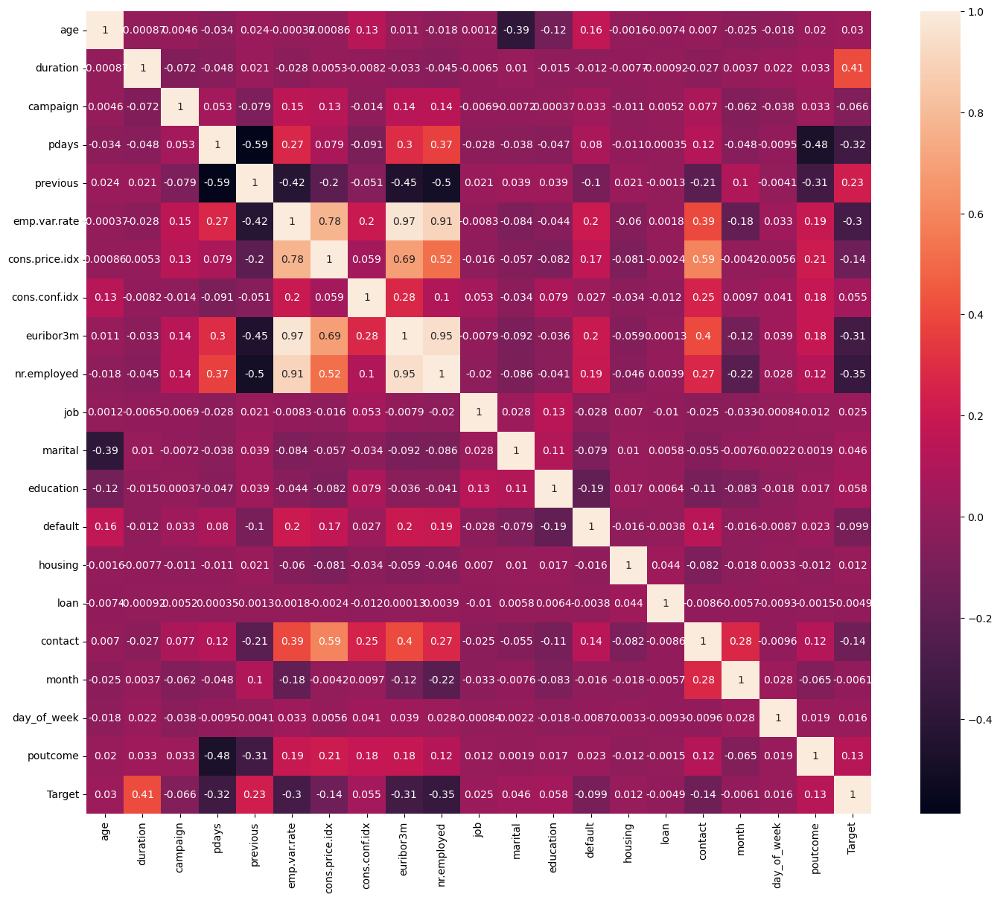

In [299]:
# Seaborn graph of correlation matrix

fig = plt.subplots(figsize = (17,14))
sns.heatmap(corr_matrix, annot = True)

## Step 3 - Data Insights Discovered sofar

#### Missing data and duplicates
1. There are no missing data / NaN values in any of the columns and the dataset is clean
2. There are 12 duplicates in the dataset, which will be removed.

#### From the Numerical side 
3. Age - Data is symmetric, median about 40, some outliers about 65, so older people present in data
4. Lots of outliers in duration... from metadata, told to drop this variable if you want an accurate prediction.
5. Lot of outliers in campaign: right skewed, censored distribution, starting at 0. Most data points at lower end. Median is low, many outliers, most campaigns have a low number of contacts
6. pdays has a lot of outliers... number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)... need to either change the 999 values or drop them 
7. Lot of outliers in Previous: left skewed, censored distribution, starting at 0... number of contacts performed before this campaign and for this client (numeric)
8. Seems like two distinct monetary policy regimes: higher interest rate in the start of the period, and lower later when in the recession and the ECB cut its rates.
9. nr.employ.var.rate and nr.employed seems to follow same distribution as monetary policy which makes sense.

#### From the categorical side
10. Most people work in admin jobs
11. Most people are married
12. Most people have a university degree and barely anyone is illiterate.
13. Most people have a house
14. Most people don't have a loan
15. Most people are contacted via their mobile(cellular) phones
16. Most occurring month is May for an entry in the dataset
17. Most occurring day is Thursday
18. Most outcomes are non-existent. Need to figure out if that is for the training data part. Otherwise I think you'd need to drop that if that is the variable of interest.
19. Most y's are no. Y is the desired target: Has the client subscribed a term deposit? (binary: "yes","no")

### target variable
20. Y is the desired target: Has the client subscribed a term deposit? (binary: "yes","no")

#### Correlation matrix
##### Strong Positive correlations.
21. Euribor, and emp rate, and number employed have a very high correlation, makes sense as employment follows business cycle and euribor rate reacts to inflation / business cycle depending on the central banks policy
22. Consumer price index also correlated with emp rate which makes sense as inflation also follows the business cycle
23. The Number of those employed and the emp rate also highly correlated which makes sense as they are both based on the same underlying data, when more people are employed the employment rate is higher.
24. CPI rate is heavily associated to the euribor rate, as the euribor rate increases when inflation is high as that is central bank rule to target inflation
25. The contacts variable and the cpi index has a high enough correlation which is surprising, but perhaps banks make more contacts in low inflation periods or deflationary periods such as recessions to make more money and effort into getting clients, and in higher inflation periods, they make money easier as you would be closer to full employment.

##### Strong Negative Correlations.
26. High negative correlation between pdays and previous probably means that people with higher previous contacts are more likely to be contacted more recently, so pdays will be closer to 0. Conversely, because of the large amount of 999's in the data, people who were not contacted previous = 0, then pdays would be 999.
27. (-.48) > 'pdays' and 'poutcome' => as the number of days since the client was last contacted increases, the poutcome value decreases.
28. (-0.5) > nr.employed and previous => as the number of employed goes up, the number of previous contacts decreases
29. (0.46) > euribor3m and previous => as the euribor rate goes up, the number of previous contacts decreases.

#### Additional Notes
1. 'duration' column = last contact duration, in seconds (numeric). Important note from data source: this attribute highly affects the output target but should be discarded for realistic predictive models due to data leakage.
2. Duplicates - There are 0.1% duplicate rows (12 rows), will be deleted.
3. Categorical Data: 'days_of_week' has even distribution, 'month' shows most calls in May, 'poutcome' has very few customers with previous marketing campaigns exposure.
4. Numerical Data: 'campaign' shows 42% customers contacted once, 67% contacted twice. 'pdays' and 'previous' need special attention.
5. Outliers: 'age' has valid outliers (17-98), 'campaign' has 2% outliers, 'pdays' is heavily skewed with 96.3% '999' values.
6. Imbalance: Present in 'default', 'loan', and 'poutcome' columns.
7. 'previous' has 86.3% zeros (no prior contacts).
8. There is no Missing Data/NaN values in the dataset.

## Step 4 - Data Clearning & Feature Engineering

1. There are 12 duplicates in the dataset, which will be removed.
2. pdays numeric; 999 means client was not previously contacted) decide either to drop or replace by mode of previously contacted.
3. Poutcome is related to pdays, so again we either drop the not previously contacted or keep them.
4. A lot of categorical variables with unknowns, either replace them with mode or drop them. 
5. In the metadata it says to drop duration if the intention is to have a realistic predictive model... so we will drop it.
6. There was a lot of correlation between euribor and cons.price.idx','emp.var.rate','nr.employed', euribor reacts to the state of the economy so is probably the best varaible to keep, the others should probably be discarded.
7. Should Winzorisie the data to acocunt for the extreme outliers.
8. Dropping any new duplicates created if any. 
   

In [300]:
# 1.Check shape and then delete duplicates
print("shape before deletion of duplication", bankdf.shape)

# identify the duplicates
print('num of dups in df = {}'.format(bankdf.duplicated().sum()))

# drop the duplicates
bankdf.drop_duplicates(inplace=True, keep='first')

# verify duplicated are removed
print('after drop - num of dups in merged df = {}'.format(bankdf.duplicated().sum()))

#Check shape after 
print("shape after deletion of duplication", bankdf.shape)

shape before deletion of duplication (41188, 21)
num of dups in df = 12
after drop - num of dups in merged df = 0
shape after deletion of duplication (41176, 21)


In [301]:
# 2. pdays numeric; 999 means client was not previously contacted)

## Two options here

### Option one is to delete all variables where they werent contacted in the previous campagin:

### Option two is to get the mode of where they werent contacted in a previous campagin and replace that value.

#### Note we tried both ways, the second option was better as you don't lose data in the other varaibles which could be predictors here and our 
#### ROC and accuracy was better, but not much better

bankdf1 = bankdf[bankdf['pdays'] != 999]
pdays_mode = bankdf1['pdays'].mode()[0]
bankdf['pdays'] = bankdf['pdays'].replace({999:pdays_mode })


In [302]:
#3. Because we keep them probably best of keeping previous. 
## - previous: number of contacts performed before this campaign and for this client (numeric)


In [303]:
## 4. There is a lot of rows with unkown in the categorical variables so dropping them
### Could use the mode of the categorical variables but this seems cleaner for prediction here. 

bankdf = bankdf[~bankdf.isin(['unknown']).any(axis=1)]
print(bankdf.shape)

(30478, 21)


In [304]:
#5.
##Dropping duration as the meta data should be discarded if you want a realsitic model 
bankdf = bankdf.drop(['duration'], axis = 1)
print(bankdf.columns)

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'campaign', 'pdays', 'previous',
       'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed', 'Target'],
      dtype='object')


In [305]:
#6 Should only really keep cpi and euribor and drop the emplomnet varaibles which depend on both of these because of the high correaltion
## can probably only euribor as that tracks the business cycle and reacts to infaltion, and ultiamtely controls the level of employment

bankdf = bankdf.drop(['cons.price.idx','emp.var.rate','nr.employed'],axis =1)
print(bankdf.columns)
print(bankdf.shape)

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'campaign', 'pdays', 'previous',
       'poutcome', 'cons.conf.idx', 'euribor3m', 'Target'],
      dtype='object')
(30478, 17)


In [306]:
# 7. Winzorising the data for extreme values
from scipy.stats.mstats import winsorize

# Select numerical columns
numerical_cols = bankdf.select_dtypes(include=['number']).columns

# Define 1% limit on both tails)
lower = 0.01  # 1% percentile lower tail
upper = 0.99  # 99% percentile upper tail

# Apply winzoristiation 
for col in numerical_cols:
    bankdf[col] = winsorize(bankdf[col], limits=(lower, 1-upper))


In [307]:
bankdf.shape


(30478, 17)

In [308]:
# 8. Dropping any new duplicates created if any. 
bankdf.drop_duplicates(inplace = True)
print(bankdf.shape)

(29055, 17)


In [309]:
bankdf.describe()

,age,campaign,pdays,previous,cons.conf.idx,euribor3m
count,29055.000000,29055.000000,29055.000000,29055.000000,29055.000000,29055.000000
mean,39.084598,2.500568,3.089520,0.188711,-40.598045,3.434351
std,10.097102,2.272056,0.544191,0.463521,4.803235,1.784715
min,23.000000,1.000000,3.000000,0.000000,-50.000000,0.654000
25%,31.000000,1.000000,3.000000,0.000000,-42.700000,1.313000
50%,37.000000,2.000000,3.000000,0.000000,-41.800000,4.856000
75%,46.000000,3.000000,3.000000,0.000000,-36.400000,4.961000
max,71.000000,14.000000,7.000000,2.000000,-26.900000,4.968000


## Step 5 - Data Preparation

In [310]:
# ---- Label Encoding----
df = bankdf
# encode categorical variables using label Encoder

df_categorical = df.select_dtypes(include=['object'])
df_categorical.head()

# applying label encoder to df_categorical
le = preprocessing.LabelEncoder()
df_categorical = df_categorical.apply(le.fit_transform)
df_categorical.head()

# Next, Concatenate df_categorical dataframe with original df (dataframe)

# first, Drop earlier duplicate columns which had categorical values
df = df.drop(df_categorical.columns, axis = 1)
df = pd.concat([df,df_categorical], axis =1)
df.head()

,age,campaign,pdays,previous,cons.conf.idx,euribor3m,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,Target
0,56,1,3,0,-36.4,4.857,3,1,0,0,0,0,1,6,1,1,0
2,37,1,3,0,-36.4,4.857,7,1,3,0,1,0,1,6,1,1,0
3,40,1,3,0,-36.4,4.857,0,1,1,0,0,0,1,6,1,1,0
4,56,1,3,0,-36.4,4.857,7,1,3,0,0,1,1,6,1,1,0
6,59,1,3,0,-36.4,4.857,0,1,5,0,0,0,1,6,1,1,0


In [311]:
#--- START SMOTE -----
# view of data prior to smote being applied
print(' target value count - column we will apply SMOTE to \n 0 = no and 1 = yes \n {} '.format(df['Target'].value_counts()))
print('------')
print ("Rows     : " ,df.shape[0])
print ("Columns  : " ,df.shape[1])
print('------')
print ("Features : \n" ,bankdf.columns.tolist())
print('------')
print("Target Missing values :  {}".format(df['Target'].isnull().sum()))
print('------')


 target value count - column we will apply SMOTE to 
 0 = no and 1 = yes 
 Target
0    25239
1     3816
Name: count, dtype: int64 
------
Rows     :  29055
Columns  :  17
------
Features : 
 ['age', 'job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'campaign', 'pdays', 'previous', 'poutcome', 'cons.conf.idx', 'euribor3m', 'Target']
------
Target Missing values :  0
------


Target
0    25239
1     3816
Name: count, dtype: int64
SMOTE over-sampling:
Target
0    25239
1    25239
Name: count, dtype: int64


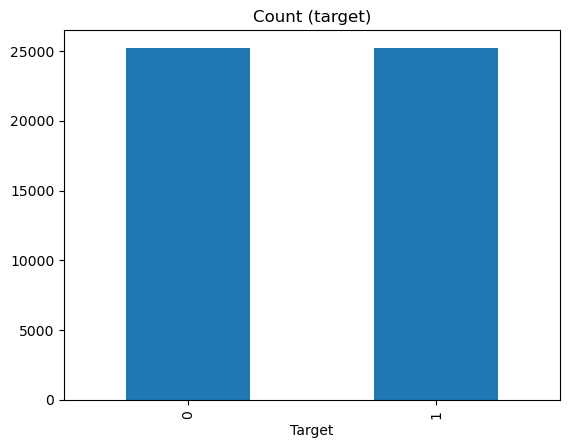

In [312]:
# ---- SMOTE -----
#from imblearn.over_sampling import SMOTE

print(df['Target'].value_counts())
X = df.drop('Target', axis=1)
Y = df['Target']

sm = SMOTE(random_state=42)
X_res, Y_res = sm.fit_resample(X, Y)

df_smote_over = pd.concat([pd.DataFrame(X_res), pd.DataFrame(Y_res, columns=['Target'])], axis=1)

# print of value changes for both values
print('SMOTE over-sampling:')
print(df_smote_over['Target'].value_counts())

#plot post SMOTE
df_smote_over['Target'].value_counts().plot(kind='bar', title='Count (target)')

#re-assign the new smote dataframe to our working daataframe, 'df'
df=df_smote_over

In [313]:
#---- END SMOTE ------
# view of data post smote being applied
print(' target value count - column we will apply SMOTE to \n 0 = no and 1 = yes \n {} '.format(df['Target'].value_counts()))
print('------')
print ("Rows     : " ,df.shape[0])
print ("Columns  : " ,df.shape[1])
print('------')
print ("Features : \n" ,bankdf.columns.tolist())
print('------')
print("Target Missing values :  {}".format(df['Target'].isnull().sum()))
print('------')

 target value count - column we will apply SMOTE to 
 0 = no and 1 = yes 
 Target
0    25239
1    25239
Name: count, dtype: int64 
------
Rows     :  50478
Columns  :  17
------
Features : 
 ['age', 'job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'campaign', 'pdays', 'previous', 'poutcome', 'cons.conf.idx', 'euribor3m', 'Target']
------
Target Missing values :  0
------


In [314]:
df['Target'].value_counts()

Target
0    25239
1    25239
Name: count, dtype: int64

<Axes: >

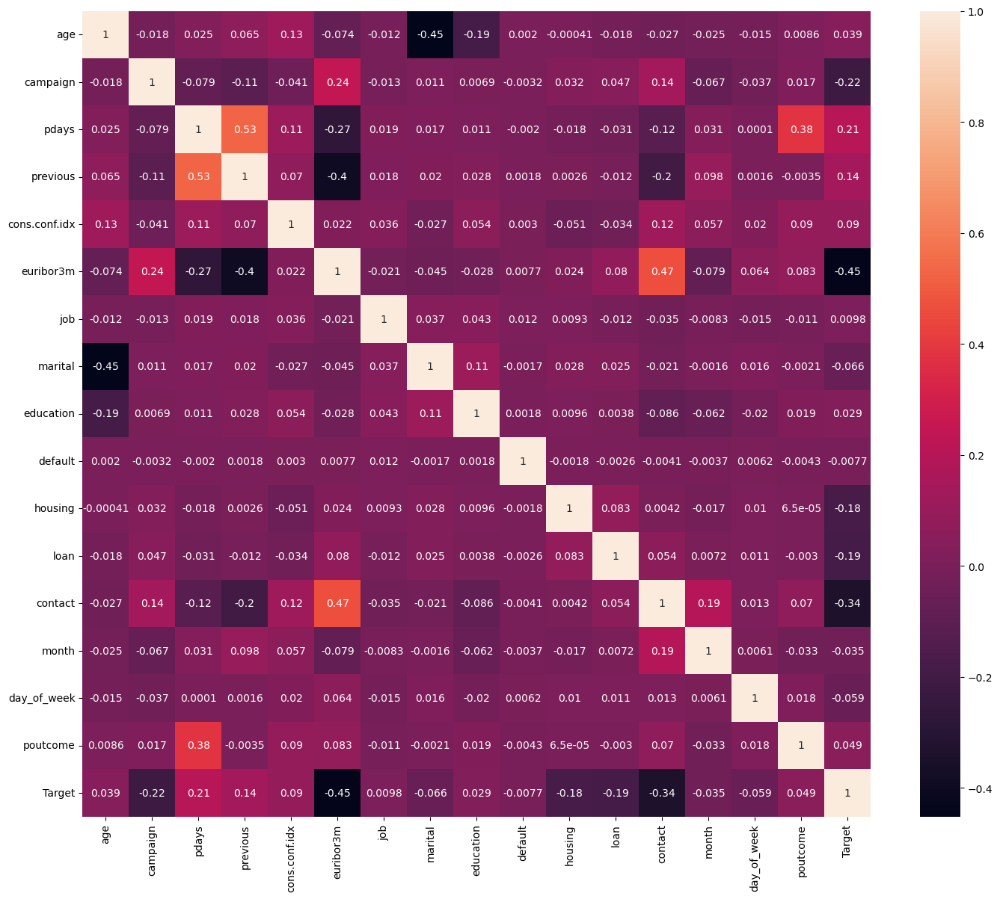

In [315]:
# Checking the correlations after making changes to the data
## Noting how the sign changed between pdays and previous now. 

# making correlation matrix
corr_matrix=df.corr()
corr_matrix

# Seaborn graph of correlation matrix

fig = plt.subplots(figsize = (17,14))
sns.heatmap(corr_matrix, annot = True)

In [316]:
# Putting independent variables/features to X
X = df.drop('Target',axis=1)

# Putting response/dependent variable/feature to y
y = df['Target']

# Splitting the data into train and test
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.30,random_state=99)

y_train.dtypes
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))
print(len(X_train)/(len(X_train)+len(X_test)))
print(len(X_test)/(len(X_train)+len(X_test)))

35334
35334
15144
15144
0.6999881136336622
0.3000118863663378


## Step 6 - Creating the Models

In [317]:
# Firstly I am creating a cross validation version on the train data and then will get parameters for random grid search.

In [318]:
classifiers = [
   ('NB', GaussianNB()),
   ('DT', DecisionTreeClassifier()),
   ('RF', RandomForestClassifier()),
   ('LR', LogisticRegression()),
   ('NN', nn.MLPClassifier()),
   ('XGB', XGBClassifier(n_estimators=100))]

# Logging setup
log_cols = ["Classifier", "Accuracy (CV Mean)"]
log = pd.DataFrame(columns=log_cols)

# Define the cross-validation strategy
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Loop through classifiers
for name, model in classifiers:
    name = model.__class__.__name__

    # Get cross validation prediction
    y_pred_cv = cross_val_predict(model, X_train, y_train, cv=cv, method='predict')

    # Compute cross-validation accuracy
    cv_scores = cross_val_score(model, X_train, y_train, scoring='accuracy', cv=cv, n_jobs=-1)
    cv_mean = np.mean(cv_scores)

    # Log results
    log_entry = pd.DataFrame([[name, cv_mean]], columns=log_cols)
    log = pd.concat([log, log_entry])


C:\Users\eamon\AppData\Local\Temp\ipykernel_22696\1449647424.py:29: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  log = pd.concat([log, log_entry])
c:\Users\eamon\anaconda3\envs\assignment-a\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\eamon\anaconda3\envs\assignment-a\Lib\site-packages\sklearn\l

Confusion Matrix for GaussianNB (Cross-Validation):
[[15985  1724]
 [ 2461 15164]]

Confusion Matrix for DecisionTreeClassifier (Cross-Validation):
[[15985  1724]
 [ 2461 15164]]

Confusion Matrix for RandomForestClassifier (Cross-Validation):
[[15985  1724]
 [ 2461 15164]]



c:\Users\eamon\anaconda3\envs\assignment-a\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\eamon\anaconda3\envs\assignment-a\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

Confusion Matrix for LogisticRegression (Cross-Validation):
[[15985  1724]
 [ 2461 15164]]



c:\Users\eamon\anaconda3\envs\assignment-a\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Confusion Matrix for MLPClassifier (Cross-Validation):
[[15985  1724]
 [ 2461 15164]]

Confusion Matrix for XGBClassifier (Cross-Validation):
[[15985  1724]
 [ 2461 15164]]



<Figure size 640x480 with 0 Axes>

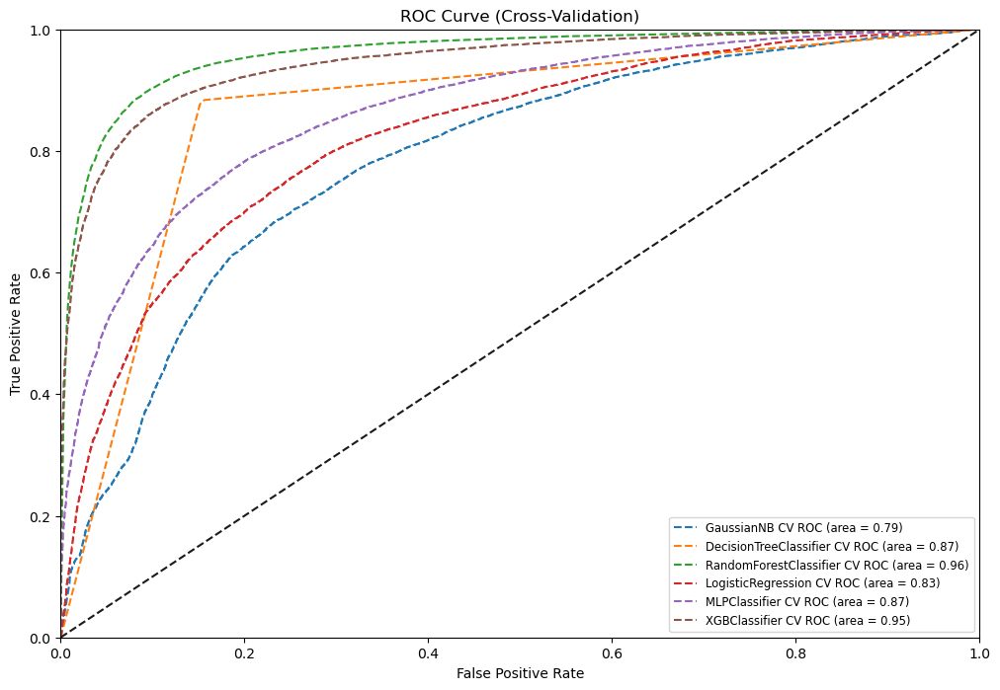

               Classifier  Accuracy (CV Mean)
0              GaussianNB            0.695959
0  DecisionTreeClassifier            0.863106
0  RandomForestClassifier            0.901794
0      LogisticRegression            0.752391
0           MLPClassifier            0.785843
0           XGBClassifier            0.881559


In [319]:

# Plot ROC curve for cross-validated predictions
plt.clf()
plt.figure(figsize=(12, 8))

# Loop through classifiers
for name, model in classifiers:
    name = model.__class__.__name__

    # ROC curve and AUC for cross-validated model
    ## here we using cross_val_predict : https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_predict.html

    #sklearn.model_selection.cross_val_predict(estimator, X, y=None, *, groups=None, cv=None, n_jobs=None, verbose=0, 
    #params=None, pre_dispatch='2*n_jobs', method='predict')

    ## basically getting model.predict_proba but for the cross validation figures. 

    #### Note we aren't comparing these directly, but just seeing if there are large differences between them more so. between cross validation 
    #### and the actual model evaluations below
    ####### Note also this is all done on x_train and y_train. 
    
    y_pred_proba = cross_val_predict(model, X_train, y_train, cv=cv, method='predict_proba')[:, 1]
    fpr_cv, tpr_cv, _ = roc_curve(y_train, y_pred_proba)
    roc_auc_cv = auc(fpr_cv, tpr_cv)

    # Plot ROC curves for cross-validation model
    plt.plot(fpr_cv, tpr_cv, linestyle='--', label='%s CV ROC (area = %0.2f)' % (name, roc_auc_cv))


    # Print confusion matrix for cross-validated predictions
    cm_cv = confusion_matrix(y_train, y_pred_cv)
    print(f"Confusion Matrix for {name} (Cross-Validation):")
    print(cm_cv)
    print('')


# Finalize ROC plot
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Cross-Validation)')
plt.legend(loc=0, fontsize='small')
plt.show()

# Print log of results
print(log)

### Summary of Cross Validation
#### XGBoost, Logistic regression and MLPClassifier are joint best for ROC
##### Logistic is best in terms of accuracym then MLPClassifer then XGBoost.

## This below is getting random paramters for the random search method
### Each model here has different parameteres and param grids hence outlining them here

In [320]:
# Define the models and their respective parameter grids
models = [
    {
        'name': 'DecisionTree',
        'model': DecisionTreeClassifier(),
        'param_grid': {
            'max_depth': [3, 6, 9, None],
            'max_features': ['sqrt', 'log2', None],
            'max_leaf_nodes': [3, 6, 9, None]
        }
    },
    {
        'name': 'RandomForest',
        'model': RandomForestClassifier(),
        'param_grid': {
            'n_estimators': [25, 50, 100, 150],
            'max_depth': [3, 6, 9, None],
            'max_features': ['sqrt', 'log2', None],
            'max_leaf_nodes': [3, 6, 9, None]
        }
    },
    {
        'name': 'LogisticRegression',
        'model': LogisticRegression(),
        'param_grid': {
            'penalty': ['l1', 'l2'],
            'solver': ['liblinear', 'newton-cg']
        }
    },
    {
        'name': 'MLPClassifier',
        'model': nn.MLPClassifier(),
        'param_grid': {
            'hidden_layer_sizes': [(50,), (100,), (150,)],
            'activation': ['relu', 'tanh'],
            'alpha': [0.0001, 0.001, 0.01]
        }
    },
    {
        'name': 'XGBClassifier',
        'model': XGBClassifier(n_estimators=100),
        'param_grid': {
            'n_estimators': [25, 50, 100, 150],
            'max_depth': [3, 6, 9],
            'learning_rate': [0.01, 0.1, 0.2],
            'subsample': [0.8, 0.9, 1.0]
        }
    }
]

# List to store the best estimators and their parameters
best_estimators = []

# Loop through each model and perform RandomizedSearchCV
for model_info in models:
    print(f"Training {model_info['name']}...")
    
    # Perform RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=model_info['model'],
        param_distributions=model_info['param_grid'],
        n_iter=10,  # Number of parameter settings to sample
        cv=3,       # Number of cross-validation folds
        random_state=42,
        n_jobs=-1,  # Use all available cores
        verbose=2   # Print progress updates
    )
    
    # Fit the model
    random_search.fit(X_train, y_train)
    
    # Store the best estimator and its parameters
    best_estimators.append({
        'name': model_info['name'],
        'best_estimator': random_search.best_estimator_,
        'best_params': random_search.best_params_,
        'best_score': random_search.best_score_
    })
    
    # Print the results
    print(f"Best parameters for {model_info['name']}: {random_search.best_params_}")
    print(f"Best cross-validation score for {model_info['name']}: {random_search.best_score_}")
    print(f"Best estimator for {model_info['name']}: {random_search.best_estimator_}")

Training DecisionTree...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters for DecisionTree: {'max_leaf_nodes': None, 'max_features': 'log2', 'max_depth': None}
Best cross-validation score for DecisionTree: 0.8313805399898117
Best estimator for DecisionTree: DecisionTreeClassifier(max_features='log2')
Training RandomForest...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters for RandomForest: {'n_estimators': 150, 'max_leaf_nodes': None, 'max_features': None, 'max_depth': 9}
Best cross-validation score for RandomForest: 0.8238523801437708
Best estimator for RandomForest: RandomForestClassifier(max_depth=9, max_features=None, n_estimators=150)
Training LogisticRegression...
Fitting 3 folds for each of 4 candidates, totalling 12 fits


c:\Users\eamon\anaconda3\envs\assignment-a\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 4 is smaller than n_iter=10. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
c:\Users\eamon\anaconda3\envs\assignment-a\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
3 fits failed out of a total of 12.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\eamon\anaconda3\envs\assignment-a\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\eamo

Best parameters for LogisticRegression: {'solver': 'newton-cg', 'penalty': 'l2'}
Best cross-validation score for LogisticRegression: 0.7545706684779532
Best estimator for LogisticRegression: LogisticRegression(solver='newton-cg')
Training MLPClassifier...
Fitting 3 folds for each of 10 candidates, totalling 30 fits


c:\Users\eamon\anaconda3\envs\assignment-a\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Best parameters for MLPClassifier: {'hidden_layer_sizes': (150,), 'alpha': 0.0001, 'activation': 'tanh'}
Best cross-validation score for MLPClassifier: 0.8077772117507217
Best estimator for MLPClassifier: MLPClassifier(activation='tanh', hidden_layer_sizes=(150,))
Training XGBClassifier...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters for XGBClassifier: {'subsample': 0.9, 'n_estimators': 100, 'max_depth': 9, 'learning_rate': 0.1}
Best cross-validation score for XGBClassifier: 0.8814739344540669
Best estimator for XGBClassifier: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              

## Step 7 - Evaluating the Models

In [321]:
# Using normal version with no random grid. 

GaussianNB Accuracy= 0.690108293713682
Predicted     0      1    All
Actual                       
0          3774   3756   7530
1           937   6677   7614
All        4711  10433  15144



C:\Users\eamon\AppData\Local\Temp\ipykernel_22696\464084488.py:29: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  log = pd.concat([log, log_entry])


DecisionTreeClassifier Accuracy= 0.8621896460644479
Predicted     0     1    All
Actual                      
0          6402  1128   7530
1           959  6655   7614
All        7361  7783  15144

RandomForestClassifier Accuracy= 0.9051769677760169
Predicted     0     1    All
Actual                      
0          6810   720   7530
1           716  6898   7614
All        7526  7618  15144



c:\Users\eamon\anaconda3\envs\assignment-a\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression Accuracy= 0.752905441098785
Predicted     0     1    All
Actual                      
0          5640  1890   7530
1          1852  5762   7614
All        7492  7652  15144

MLPClassifier Accuracy= 0.8006471209720021
Predicted     0     1    All
Actual                      
0          5935  1595   7530
1          1424  6190   7614
All        7359  7785  15144

XGBClassifier Accuracy= 0.8847068145800316
Predicted     0     1    All
Actual                      
0          6795   735   7530
1          1011  6603   7614
All        7806  7338  15144



<Figure size 640x480 with 0 Axes>

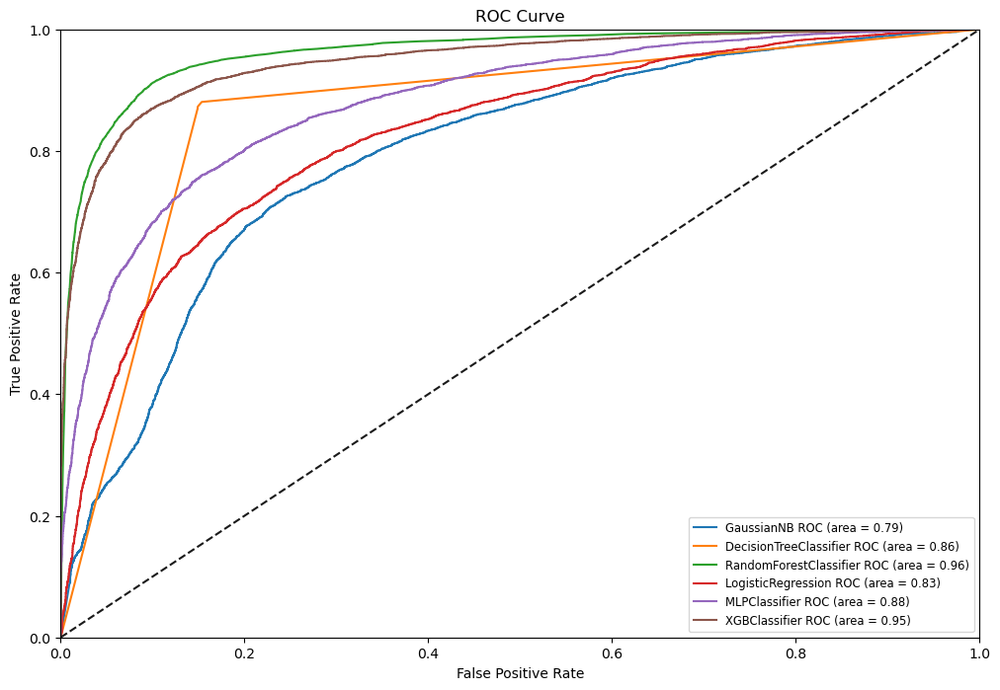

In [322]:
log_cols=["Classifier", "Accuracy"]
log = pd.DataFrame(columns=log_cols)

classifiers = [
   ('NB', GaussianNB()),
   ('DT', DecisionTreeClassifier()),
   ('RF', RandomForestClassifier()),
   ('LR', LogisticRegression()),
   ('NN', nn.MLPClassifier()),
   ('XGB', XGBClassifier(n_estimators=100))]

plt.clf()
plt.figure(figsize=(12,8))

for name, model in classifiers:
   model.fit(X_train, y_train)
    # This line retrieves the name of the classifier's class dynamically.
    #model.__class__ gives the class of the object (e.g., KNeighborsClassifier).
    # .name__ extracts the name of the class as a string (e.g., "KNeighborsClassifier").
   name = model.__class__.__name__

   train_predictions = model.predict(X_test)
   acc = accuracy_score(y_test, train_predictions)
   print (name, "Accuracy=", acc)

   log_entry = pd.DataFrame([[name, acc*100]], columns=log_cols) 
    # columns when creating the data frame.. ensures first value (name) goes under "Classifier" and the second (acc * 100) goes under "Accuracy".
    #   log = log.append(log_entry)
   log = pd.concat([log, log_entry])

   Y_predict_prob = model.predict_proba(X_test)[:,1]

   fpr, tpr, thresholds = roc_curve(y_test, Y_predict_prob)
   roc_auc = auc(fpr, tpr)

   print(pd.crosstab(pd.Series(y_test), np.array(train_predictions), rownames=['Actual'], colnames=['Predicted'], margins=True))
   print('')

   plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % (name, roc_auc))

#Roc curve
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc=0, fontsize='small')

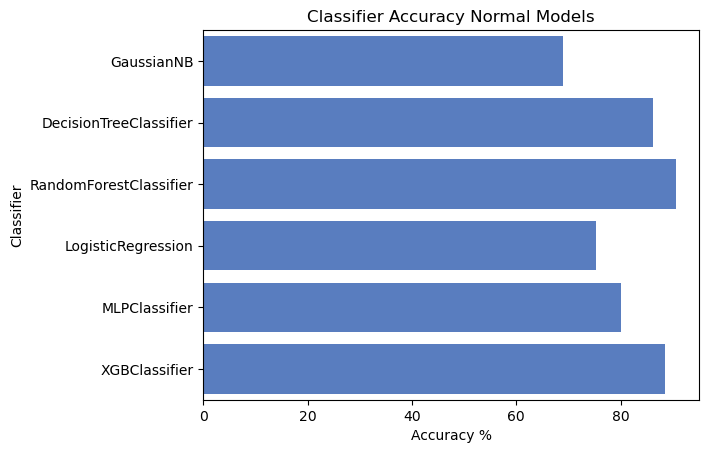

In [323]:
sns.set_color_codes("muted")
sns.barplot(x='Accuracy', y='Classifier', data=log, color="b")

plt.xlabel('Accuracy %')
plt.title('Classifier Accuracy Normal Models')
plt.show()

In [324]:
### Using the random grid version

C:\Users\eamon\AppData\Local\Temp\ipykernel_22696\553176598.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  log = pd.concat([log, log_entry], ignore_index=True)


Predicted     0     1   All
Actual                     
0          2085  2170  4255
1           107   118   225
All        2192  2288  4480

Predicted     0     1   All
Actual                     
0          2235  2020  4255
1           115   110   225
All        2350  2130  4480

Predicted     0     1   All
Actual                     
0          2106  2149  4255
1           102   123   225
All        2208  2272  4480

Predicted     0     1   All
Actual                     
0          2345  1910  4255
1           114   111   225
All        2459  2021  4480

Predicted     0     1   All
Actual                     
0          2177  2078  4255
1           111   114   225
All        2288  2192  4480



<Figure size 640x480 with 0 Axes>

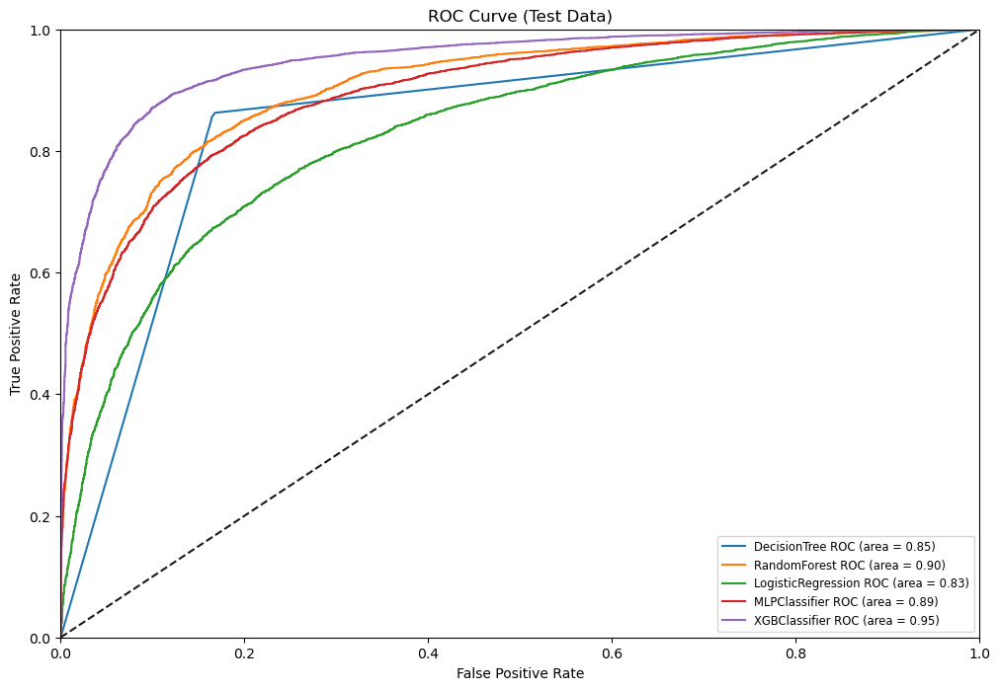

           Classifier   Accuracy
0        DecisionTree  84.548336
1        RandomForest  82.666403
2  LogisticRegression  75.422610
3       MLPClassifier  81.041997
4       XGBClassifier  88.549921


In [325]:
# Initialize log
log_cols = ["Classifier", "Accuracy"]
log = pd.DataFrame(columns=log_cols)

# Plot ROC curve for both test set and cross-validated predictions
plt.clf()
plt.figure(figsize=(12, 8))

for estimator_info in best_estimators:
    name = estimator_info['name']
    model = estimator_info['best_estimator']
    
    # Predict on the test data
    Y_predict = model.predict(X_test)
    
    # Compute accuracy
    mod_accuracy = accuracy_score(y_test, Y_predict)
    
    # Log results
    log_entry = pd.DataFrame([[name, mod_accuracy * 100]], columns=log_cols)
    log = pd.concat([log, log_entry], ignore_index=True)
    
    ## ROC curve and AUC for the model
    Y_predict_prob = model.predict_proba(X_test)[:, 1]
    fpr_mod, tpr_mod, _ = roc_curve(y_test, Y_predict_prob)
    roc_auc_mod = auc(fpr_mod, tpr_mod)
            
    # Plot ROC curve
    plt.plot(fpr_mod, tpr_mod, label='%s ROC (area = %0.2f)' % (name, roc_auc_mod))
    
    # Print confusion matrix
    confusion_matrix = pd.crosstab(
        pd.Series(y_test, name='Actual'), 
        pd.Series(Y_predict, name='Predicted'), 
        margins=True
    )
    print(confusion_matrix)
    print('')

# Finalize ROC plot
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Test Data)')
plt.legend(loc=0, fontsize='small')
plt.show()

# Print log of results
print(log)

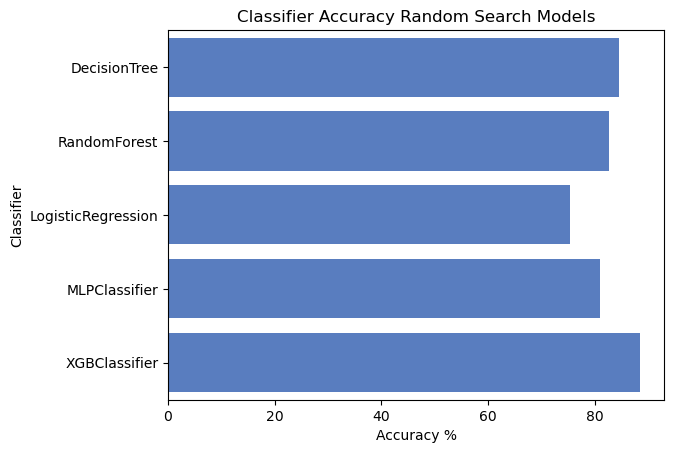

In [326]:
sns.set_color_codes("muted")
sns.barplot(x='Accuracy', y='Classifier', data=log, color="b")

plt.xlabel('Accuracy %')
plt.title('Classifier Accuracy Random Search Models')
plt.show()

## Step 8 - Recommendation & Findings

## Recommendation is to go for the XGBoost with the random search method:  Has highest ROC and Highest accuracy also. 

#### When looking at cross validation sample, XG Boost also had highest ROC and third highest accuarcy
#### When looking at samples which didnt use random search, we find that XGBOOST had highest ROC but not the highest accuracy, 

#### Results seem consistent in the XGBoost has the best ROC thorughout and ultimately the best accuaracy. 
#### The model has the best balance between the false postive rate and true positive rate and ultimately was the most accuarte. 



- Customers behaviour is difficult to predict,  is complex and our data set is probably too small. we don't have enough breadth in our distribution of data.
- Can we add to the dataset using, social media, has the client come into money
- If we had a customer ID number we could tie in the balance data which may help improve the prediction 
- We could work with the dataset containing balance and days...and try correlate those two datatsets some more to see if theres a certain time of year that provides better predictions
- Overall, we did the best we could given the constraints and think our result stacks up.
